In [84]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import networkx as nx
import numpy as np
import random
import numpy as np
import networkx as nx
import pprint as pp
import torch
import torch.nn as nn
import torch.nn.functional as F
import  gymnasium as gym
import torch.optim as optim
import matplotlib.pyplot as plt


In [85]:
class GAT_layer(nn.Module):
    def __init__(self, in_features: int, out_features: int, n_heads: int,
                 is_concat: bool = True,
                 dropout: float = 0.6,
                 leaky_relu_negative_slope: float = 0.2):


        super().__init__()

        self.is_concat = is_concat
        self.n_heads = n_heads

        if is_concat:
            assert out_features % n_heads == 0
            self.n_hidden = out_features // n_heads
        else:
            self.n_hidden = out_features


        self.linear = nn.Linear(in_features, self.n_hidden * n_heads, bias=False)
        self.attn = nn.Linear(self.n_hidden * 2, 1, bias=False)
        self.activation = nn.LeakyReLU(negative_slope=leaky_relu_negative_slope)
        self.softmax = nn.Softmax(dim=1)
        self.dropout = nn.Dropout(dropout)

    def forward(self, h: torch.Tensor, adj_mat: torch.Tensor):

        n_nodes = h.shape[0]

        g = self.linear(h).view(n_nodes, self.n_heads, self.n_hidden)


        g_repeat = g.repeat(n_nodes, 1, 1)

        g_repeat_interleave = g.repeat_interleave(n_nodes, dim=0)

        g_concat = torch.cat([g_repeat_interleave, g_repeat], dim=-1)
        g_concat = g_concat.view(n_nodes, n_nodes, self.n_heads, 2 * self.n_hidden)


        e = self.activation(self.attn(g_concat))
        e = e.squeeze(-1)

        assert adj_mat.shape[0] == 1 or adj_mat.shape[0] == n_nodes
        assert adj_mat.shape[1] == 1 or adj_mat.shape[1] == n_nodes
        assert adj_mat.shape[2] == 1 or adj_mat.shape[2] == self.n_heads
        e = e.masked_fill(adj_mat == 0, float('-inf'))
        a = self.softmax(e)

        a = self.dropout(a)
        attn_res = torch.einsum('ijh,jhf->ihf', a, g)
        if self.is_concat:
            return attn_res.reshape(n_nodes, self.n_heads * self.n_hidden)
        else:
            return attn_res.mean(dim=1)

In [89]:
class GAT(nn.Module):
    def __init__(self, nfeat, nhid, noutput,dropout, alpha_leaky_relu,n_heads,training=True):
        super(GAT, self).__init__()
        self.elu = nn.ELU()
        self.attentions1 = GAT_layer(nfeat, nhid, n_heads=n_heads, dropout=dropout, leaky_relu_negative_slope=alpha_leaky_relu, is_concat=True)
        self.attentions2 = GAT_layer(nhid , nhid, n_heads=n_heads, dropout=dropout, leaky_relu_negative_slope=alpha_leaky_relu, is_concat=True)
        self.attentions3 = GAT_layer(nhid , nhid, n_heads=n_heads, dropout=dropout, leaky_relu_negative_slope=alpha_leaky_relu, is_concat=True)
        self.training = training
        self.output_layer = GAT_layer(nhid , noutput, n_heads=1, dropout=dropout, leaky_relu_negative_slope=alpha_leaky_relu, is_concat=False)

    def forward(self, x, adj):
        x = self.attentions1(x, adj)
        x = self.elu(x)
        x = self.attentions2(x, adj)
        x = self.elu(x)
        x = self.attentions3(x, adj)
        x = self.elu(x)
        x = self.output_layer(x, adj)

        return x

In [90]:
# create a grid graph
WIDTH = 4
HEIGHT = 4
def initialize_state(thief_position : tuple, cop_position : tuple, graph: nx.Graph):
    for node in graph.nodes():
        graph.nodes[node]["agent"] = 0

    graph.nodes[thief_position]["agent"] = 1
    graph.nodes[cop_position]["agent"] = 2

    return graph
def plot_graph(graph):
    # plot thief in red, cop in blue
    node_colors = []
    for node in graph.nodes():
        if graph.nodes[node]["agent"] == 1:
            node_colors.append("red")
        elif graph.nodes[node]["agent"] == 2:
            node_colors.append("blue")
        else:
            node_colors.append("green")
    pos = {(i, j): (i, -j) for i, j in graph.nodes()}  # Specify positions for nodes
    plt.figure(figsize=(5, 5))  # Set the size of the plot
    nx.draw(graph, pos, with_labels=True, node_size=500, node_color=node_colors, font_size=10, font_weight='bold')
    plt.title('Grid Graph', fontsize=12)
    plt.show()


In [91]:
def adjency_matrix_to_mask(adj):
    mask = np.zeros(adj.shape)
    for i in range(adj.shape[0]):
        for j in range(adj.shape[1]):
            if adj[i, j] > 0:
                mask[i, j] = 1
            else:
                mask[i, j] = 0
    return mask


In [92]:
class q_network_graph_attention(nn.Module):
    def __init__(self,embedding_dim,head_num,node_graph_dim,action_dim,device="cpu"):
        super(q_network_graph_attention,self).__init__()
        self.embedding_dim = embedding_dim

        self.head_num = head_num
        self.graph_at = GAT(
            nfeat=embedding_dim,
            nhid=embedding_dim,
            noutput=32,
            dropout=0,
            alpha_leaky_relu=0.2,
            n_heads=head_num,
            training=True
        )
        self.fc1 = nn.Linear(128+1,1)
        self.fc1.to(device)

        """self.fc2 = nn.Linear(64,64)
        self.fc2.to(device)

        self.fc3 = nn.Linear(64,32)
        self.fc3.to(device)

        self.fc4 = nn.Linear(32,1)
        self.fc4.to(device)"""

    def forward(self,x,mask_matrix,action):
        action = action.squeeze(0)
        mask_matrix = torch.tensor(mask_matrix,dtype=torch.float32,requires_grad=False)
        mask_matrix = mask_matrix.unsqueeze(-1)
        x = x.squeeze(0)
        x = self.graph_at(x,mask_matrix)
        x = F.tanh(x)
        x = x.view(-1)

        x = torch.cat((x,action),dim=0)

        x = self.fc1(x)
        """ x = F.relu(x)
        x = self.fc2(x)
        x = F.relu(x)
        x = self.fc3(x)
        x = F.relu(x)
        x = self.fc4(x)"""
        return x

In [93]:
def get_node_features(graph ):
    node_features = np.zeros((len(graph.nodes()), 1))
    index = 0
    for node in graph.nodes():
        node_features[index] = graph.nodes[node]["agent"]
        index += 1
    return node_features

In [94]:
import gymnasium.spaces as spaces
class GridWorld_copsVSthief(gym.Env):
    def __init__(self,WIDTH,HEIGHT):
        grid_graph = nx.grid_2d_graph(WIDTH,HEIGHT)
        self.G = grid_graph
        self.WIDTH = WIDTH
        self.HEIGHT = HEIGHT

        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Box(low=0, high=1, shape=(WIDTH,HEIGHT,1), dtype=np.float32)

    def reset(self):
        self.thief_position = (np.random.randint(0,self.WIDTH),np.random.randint(0,self.HEIGHT))
        self.cops_position = (np.random.randint(0,self.WIDTH),np.random.randint(0,self.HEIGHT))

        self.G = initialize_state(self.thief_position,self.cops_position,self.G)

        adj = nx.adjacency_matrix(self.G).todense()
        adj = adj + np.eye(adj.shape[0])
        self.state = get_node_features(self.G),adjency_matrix_to_mask(adj)
        return self.state

    def step(self,action):
        # 0 : up
        # 1 : right
        # 2 : down
        # 3 : left
        # 4 : stay

        reward = 0

        if action == 0:
            # check if the thief is at the border
            if self.thief_position[1] == self.HEIGHT-1:
                self.thief_position = (self.thief_position[0],self.thief_position[1])
                reward =- 1

            else:
                self.thief_position = (self.thief_position[0],(self.thief_position[1]+1)%self.HEIGHT)
        elif action == 1:
            if self.thief_position[0] == self.WIDTH-1:
                self.thief_position = (self.thief_position[0],self.thief_position[1])
                reward =- 1

            else:
                self.thief_position = ((self.thief_position[0]+1)%self.WIDTH,self.thief_position[1])
        elif action == 2:
            # check if the thief is at the border
            if self.thief_position[1] == 0:
                self.thief_position = (self.thief_position[0],self.thief_position[1])
                reward =- 1

            else:
                self.thief_position = (self.thief_position[0],(self.thief_position[1]-1)%self.HEIGHT)
        elif action == 3:
            # check if the thief is at the border
            if self.thief_position[0] == 0:
                self.thief_position = (self.thief_position[0],self.thief_position[1])
                reward =- 1
            else:
                self.thief_position = ((self.thief_position[0]-1)%self.WIDTH,self.thief_position[1])
        elif action == 4:
            pass

        # reward is the distance between cops and thief, the closer the better

        #reward += -np.sqrt((self.thief_position[0]-self.cops_position[0])**2+(self.thief_position[1]-self.cops_position[1])**2) / 100
        self.G = initialize_state(self.thief_position,self.cops_position,self.G)

        adj = nx.adjacency_matrix(self.G).todense()
        adj = adj + np.eye(adj.shape[0])

        self.state = get_node_features(self.G),adjency_matrix_to_mask(adj)
        info = {}
        done = self.thief_position == self.cops_position

        if done:
            reward = 100
        return self.state,reward, _, _,info,done

    def render(self):
        plot_graph(self.G)
    def close(self):
        pass


In [96]:
import random
import torch
import torch.nn as nn
import numpy as np
from torch.utils.tensorboard import SummaryWriter

class DQN():
    def __init__(self, env, device,num_max_episode):
        self.writer = SummaryWriter()
        self.device = device
        self.env = env
        self.action_space = 4
        self.observation_space = env.WIDTH * env.HEIGHT
        self.q_network = q_network_graph_attention(
            1, 1, env.WIDTH * env.HEIGHT, 1, self.device
        )
        self.q_network.to(self.device)
        self.target_network = q_network_graph_attention(1, 1, env.WIDTH * env.HEIGHT, 1,self.device)
        self.target_network.to(self.device)
        self.target_network.load_state_dict(self.q_network.state_dict())
        self.target_update_freq = 20 # Frequency to update target network
        self.optimizer = torch.optim.Adam(self.q_network.parameters(), lr=0.025)
        self.loss = nn.MSELoss()  # Huber loss for more robust training
        self.replay_buffer = replay_buffer()
        self.gamma = 0.99
        self.epsilon = 1
        self.episode_counter = 0
        self.epsilon_decay = 0.999
        self.epsilon_min = 0.01
        self.num_episodes = num_max_episode
        self.update_freq = 10
        self.batch_size = 1024
        self.max_len_episode = 300
        self.loss_list = []
        self.step_counter = 0  # Counter for the number of steps taken so far

    def get_action(self, state, masked_matrix):
        if random.random() < self.epsilon:
            return random.randint(0, 3)
        else:
            best_act = -np.inf
            state = torch.tensor(state, dtype=torch.float32, device=self.device)
            state = state.unsqueeze(0)
            with torch.no_grad():
                for i in range(self.action_space):
                    action = torch.tensor([i], dtype=torch.float32, device=self.device)
                    action = action.unsqueeze(0)
                    q_current = self.q_network(state, masked_matrix, action)
                    if q_current > best_act:
                        best_act = q_current
                        best_action = i
            return best_action

    def sample_minibatch(self):
        minibatch = self.replay_buffer.sample(self.batch_size)
        return minibatch

    def train(self):

        for _ in range(self.num_episodes):
            state, masked_matrix = self.env.reset()
            done = False
            total_reward = 0
            for _ in range(self.max_len_episode):

                action = self.get_action(state, masked_matrix)
                next_state, reward, _, _, _, done = self.env.step(action)
                total_reward += reward
                next_state, next_masked_matrix = next_state
                self.step_counter +=1
                self.replay_buffer.add((action, (state, masked_matrix), (next_state, next_masked_matrix), reward, done))
                state = next_state
                masked_matrix = next_masked_matrix
                if done:
                    break
            self.writer.add_scalar('Reward', total_reward, self.episode_counter)
            self.episode_counter += 1

            if self.step_counter >= self.batch_size and self.step_counter % self.update_freq == 0 :
                self.update()
            # Update target network
            if self.step_counter % self.target_update_freq == 0:
                self.target_network.load_state_dict(self.q_network.state_dict())


    def evaluate(self):
        self.epsilon = 0
        with torch.no_grad():
            state, masked_matrix = self.env.reset()
            print(masked_matrix)
            print(state)
            done = False
            self.env.render()
            for i in range(self.max_len_episode):
                action = self.get_action(state, masked_matrix)
                next_state, reward, _, _, _, done = self.env.step(action)
                next_state, next_masked_matrix = next_state
                state = next_state
                masked_matrix = next_masked_matrix
                print(f"step {i} : {reward}")
                print(f"action : {action}")
                self.env.render()
                if done:
                    break
            return reward

    def update(self):
        minibatch = self.sample_minibatch()
        total_loss = 0
        for state, next_state, action, reward, done in minibatch:
            state, masked_matrix = state
            next_state, next_masked_matrix = next_state
            next_state = torch.tensor(next_state, dtype=torch.float32, device=self.device)
            next_state = next_state.unsqueeze(0)
            with torch.no_grad():
                if done:
                    target = reward
                else:
                    futur_q_best_action = -np.inf
                    for i in range(self.action_space):
                        action_tensor_i = torch.tensor([i], dtype=torch.float32, device=self.device)
                        action_tensor_i = action_tensor_i.unsqueeze(0)
                        q_value_i = self.target_network(next_state, next_masked_matrix, action_tensor_i)
                        q_value_i = q_value_i.item()  # Convert tensor to scalar value
                        print(f"q_value_i : {q_value_i}")
                        if q_value_i > futur_q_best_action:
                            futur_q_best_action = q_value_i
                            best_action = i

                    best_action = torch.tensor([best_action], dtype=torch.float32, device=self.device)
                    best_action = best_action.unsqueeze(0)

                    target = reward + self.gamma *self.target_network(next_state, next_masked_matrix, best_action)
            target = torch.tensor([target], dtype=torch.float32, device=self.device)
            state = torch.tensor(state, dtype=torch.float32, device=self.device)
            state = state.unsqueeze(0)
            action = torch.tensor([action], dtype=torch.float32, device=self.device)
            action = action.unsqueeze(0)
            q_value = self.q_network(state, masked_matrix, action)


            loss = self.loss(q_value, target)
            total_loss += loss

        total_loss = total_loss / self.batch_size
        self.optimizer.zero_grad()
        total_loss.backward()
        self.optimizer.step()
        self.step_counter += 1
        print(f"step {self.step_counter} : {total_loss}")
        self.loss_list.append(total_loss)
        # Decay exploration epsilon
        self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)
class replay_buffer():
    def __init__(self):
        self.action = []
        self.state = []
        self.next_state = []
        self.reward = []
        self.done = []
    def add(self,experience):
        self.action.append(experience[0])
        self.state.append(experience[1])
        self.next_state.append(experience[2])
        self.reward.append(experience[3])
        self.done.append(experience[4])

    def sample(self,batch_size):
        sample = random.sample(list(zip(self.state,self.next_state,self.action,self.reward,self.done)),batch_size)
        return sample
    def __len__(self):
        return len(self.action)


In [97]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
env = GridWorld_copsVSthief(2,2)
dqn = DQN(env,device=device,num_max_episode=1000)
# load model
dqn.train()

cpu
q_value_i : 0.016688868403434753
q_value_i : 0.055008456110954285
q_value_i : 0.09332804381847382
q_value_i : 0.13164763152599335
q_value_i : 0.015349410474300385
q_value_i : 0.05366900563240051
q_value_i : 0.09198859333992004
q_value_i : 0.13030818104743958
q_value_i : 0.016688868403434753
q_value_i : 0.055008456110954285
q_value_i : 0.09332804381847382
q_value_i : 0.13164763152599335
q_value_i : 0.015236034989356995
q_value_i : 0.053555622696876526
q_value_i : 0.09187520295381546
q_value_i : 0.1301947832107544
q_value_i : 0.01660609245300293
q_value_i : 0.05492568016052246
q_value_i : 0.09324527531862259
q_value_i : 0.13156485557556152
q_value_i : 0.014924228191375732
q_value_i : 0.053243815898895264
q_value_i : 0.09156341105699539
q_value_i : 0.12988299131393433
q_value_i : 0.014388114213943481
q_value_i : 0.05270770192146301
q_value_i : 0.09102728962898254
q_value_i : 0.12934687733650208
q_value_i : 0.01660609245300293
q_value_i : 0.05492568016052246
q_value_i : 0.0932452753186

KeyboardInterrupt: 

In [ ]:
dqn.num_episodes = 100000
dqn.train()


q_value_i : 0.015348829329013824
q_value_i : 0.053668417036533356
q_value_i : 0.09198799729347229
q_value_i : 0.13030758500099182
q_value_i : 0.01660609245300293
q_value_i : 0.05492568016052246
q_value_i : 0.09324527531862259
q_value_i : 0.13156485557556152
q_value_i : 0.014903485774993896
q_value_i : 0.05322307348251343
q_value_i : 0.09154266119003296
q_value_i : 0.1298622488975525
q_value_i : 0.014924228191375732
q_value_i : 0.053243815898895264
q_value_i : 0.09156341105699539
q_value_i : 0.12988299131393433
q_value_i : 0.015349410474300385
q_value_i : 0.05366900563240051
q_value_i : 0.09198859333992004
q_value_i : 0.13030818104743958
q_value_i : 0.014924228191375732
q_value_i : 0.053243815898895264
q_value_i : 0.09156341105699539
q_value_i : 0.12988299131393433
q_value_i : 0.014360345900058746
q_value_i : 0.05267993360757828
q_value_i : 0.0909995287656784
q_value_i : 0.12931911647319794
q_value_i : 0.015236034989356995
q_value_i : 0.053555622696876526
q_value_i : 0.09187520295381546

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [81]:
print(dqn.epsilon)

0.9559759577813409


[[1. 1. 1. 0.]
 [1. 1. 0. 1.]
 [1. 0. 1. 1.]
 [0. 1. 1. 1.]]
[[0.]
 [0.]
 [0.]
 [2.]]


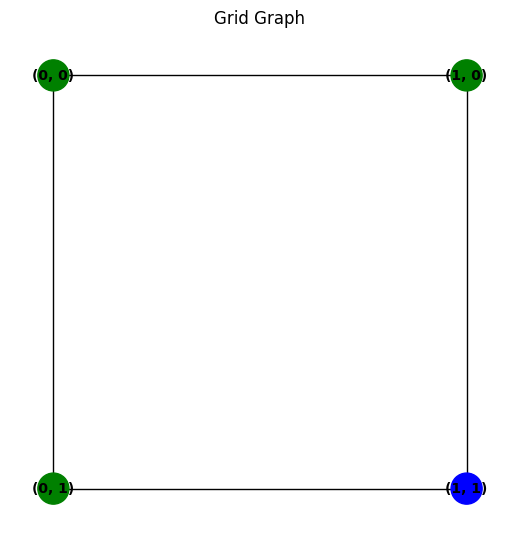

step 0 : 0
action : 3


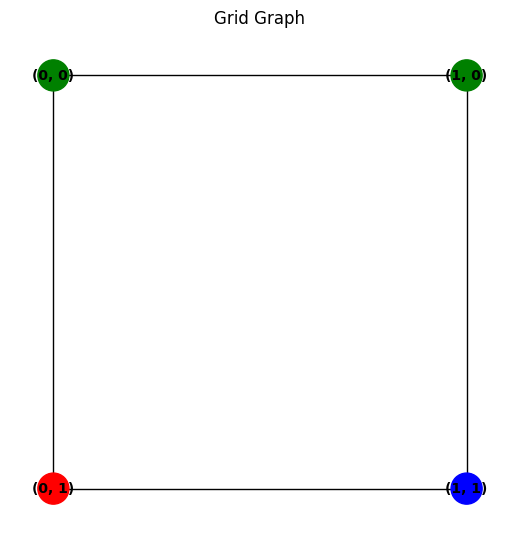

step 1 : -1
action : 3


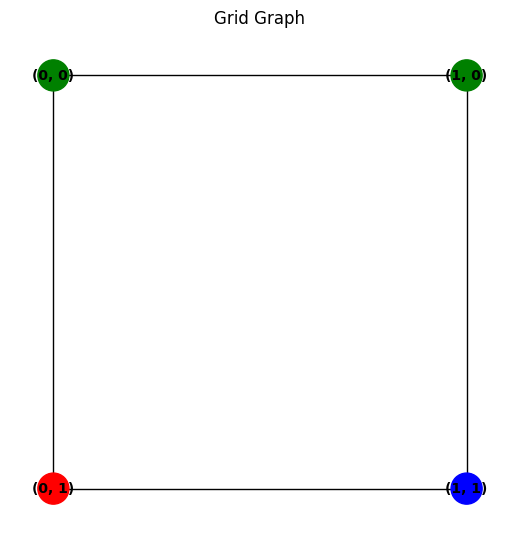

step 2 : -1
action : 3


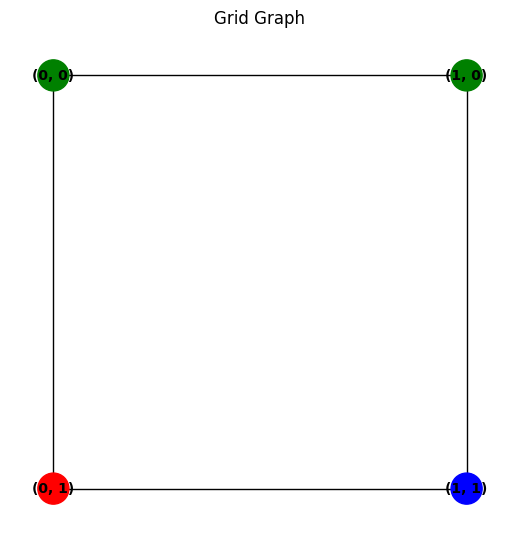

step 3 : -1
action : 3


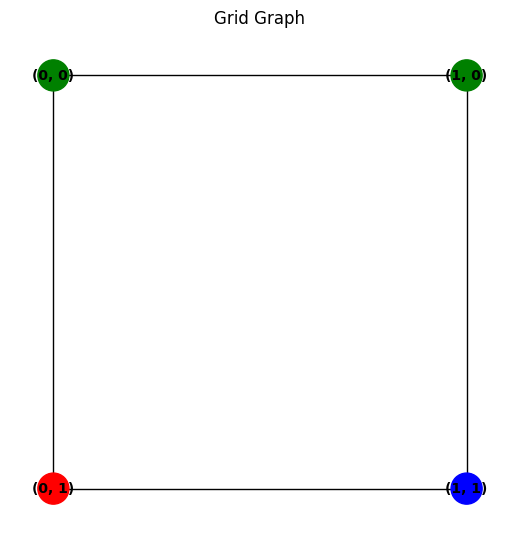

step 4 : -1
action : 3


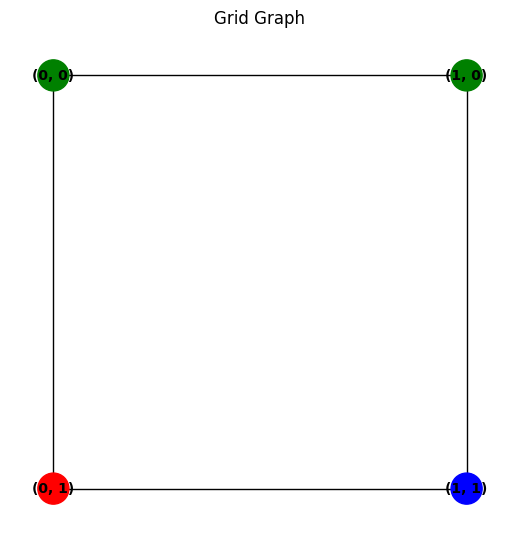

step 5 : -1
action : 3


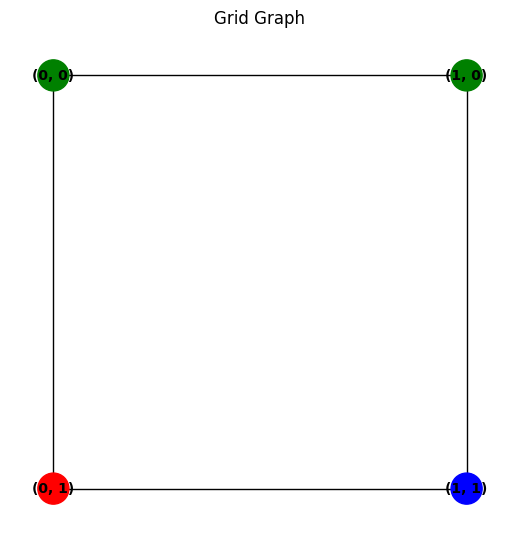

step 6 : -1
action : 3


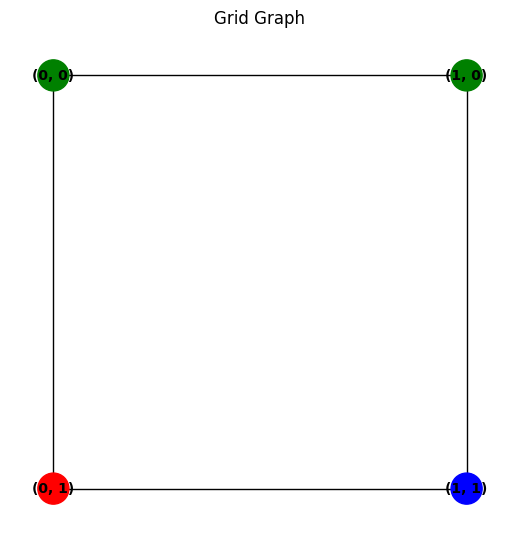

step 7 : -1
action : 3


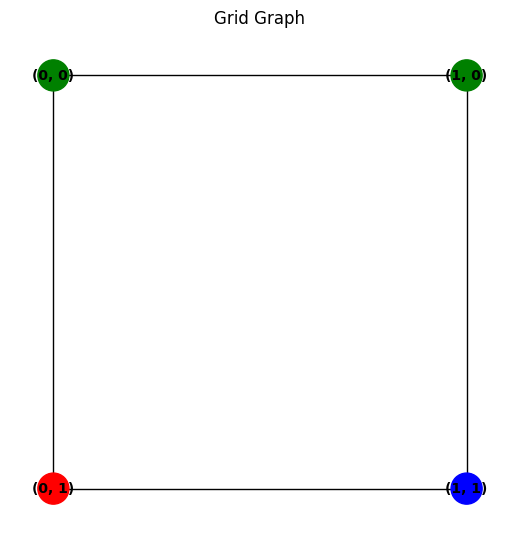

step 8 : -1
action : 3


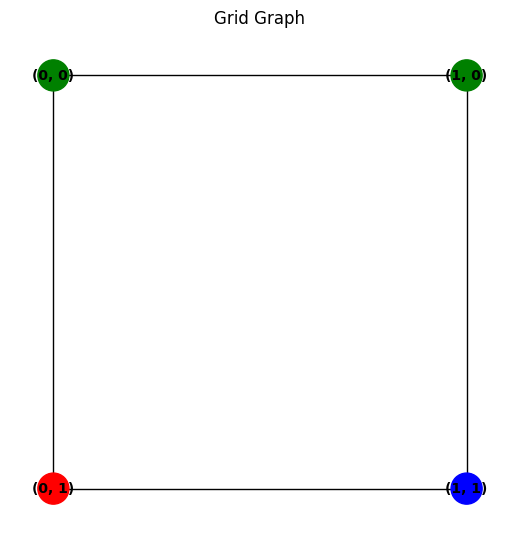

step 9 : -1
action : 3


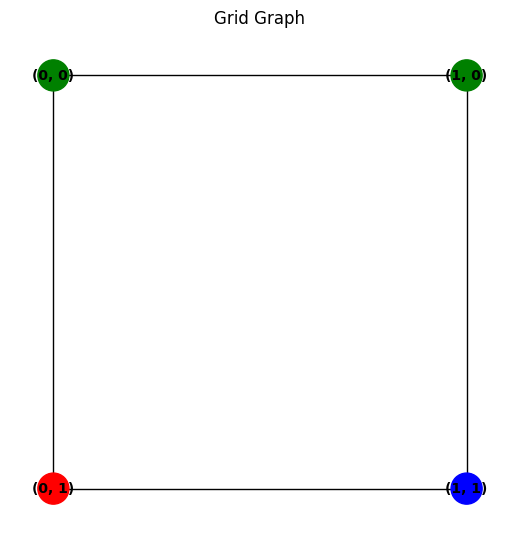

step 10 : -1
action : 3


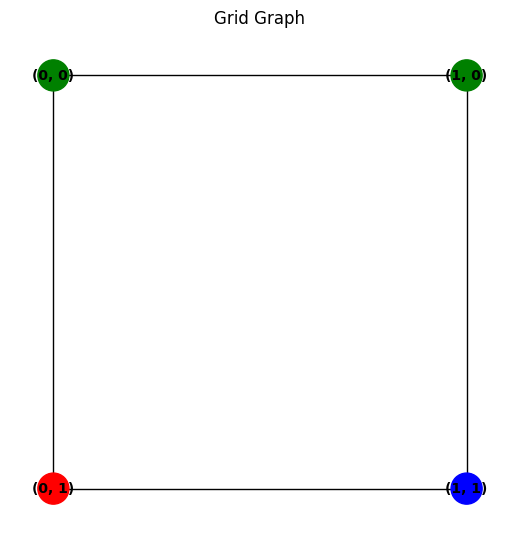

step 11 : -1
action : 3


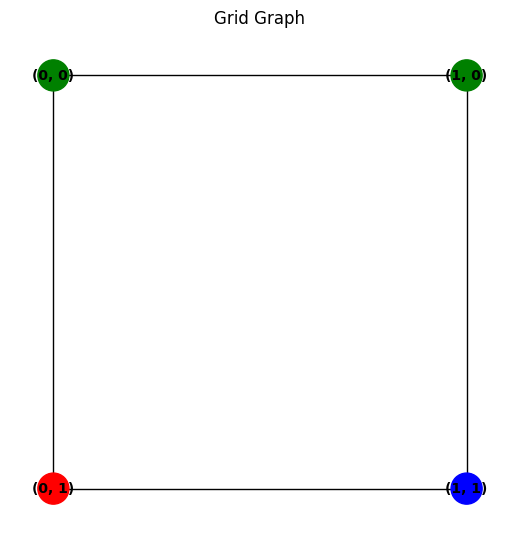

step 12 : -1
action : 3


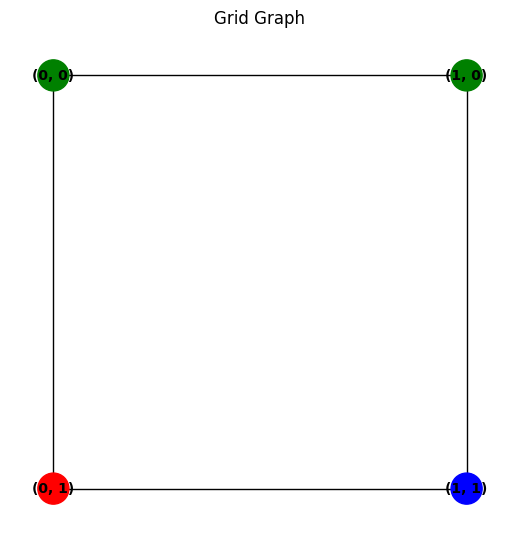

step 13 : -1
action : 3


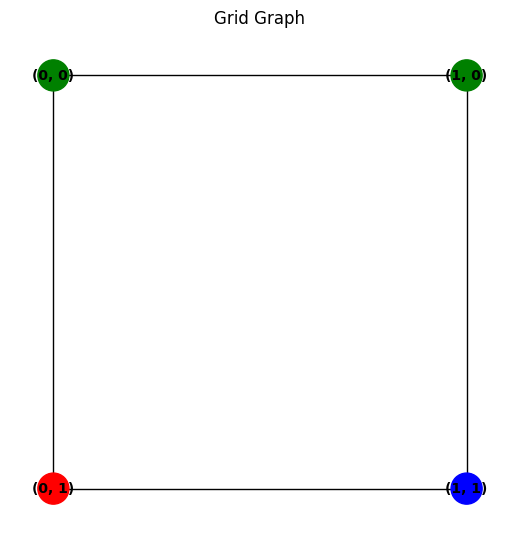

step 14 : -1
action : 3


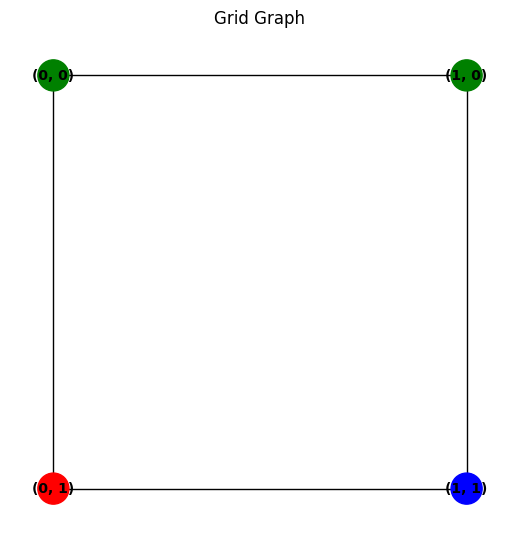

step 15 : -1
action : 3


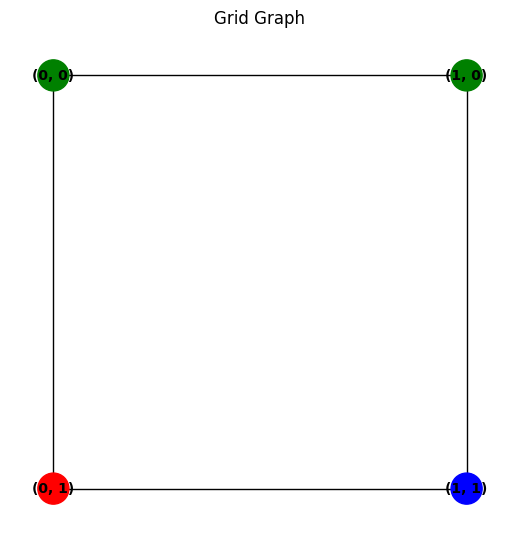

step 16 : -1
action : 3


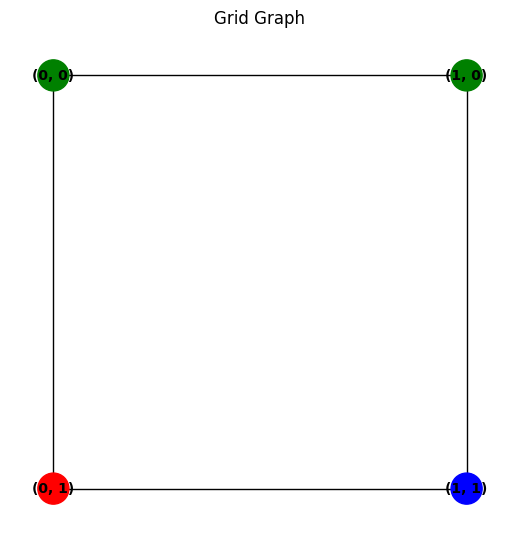

step 17 : -1
action : 3


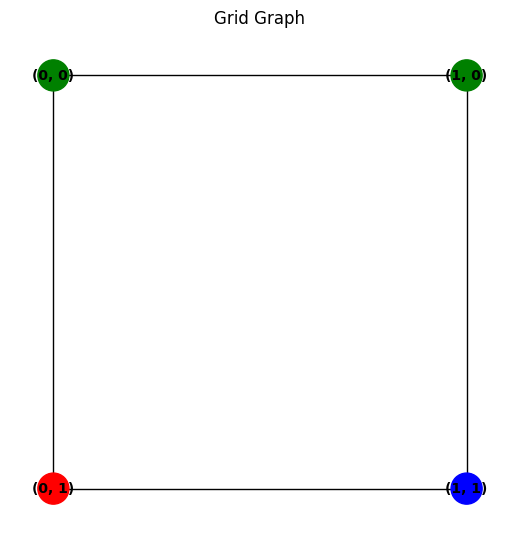

step 18 : -1
action : 3


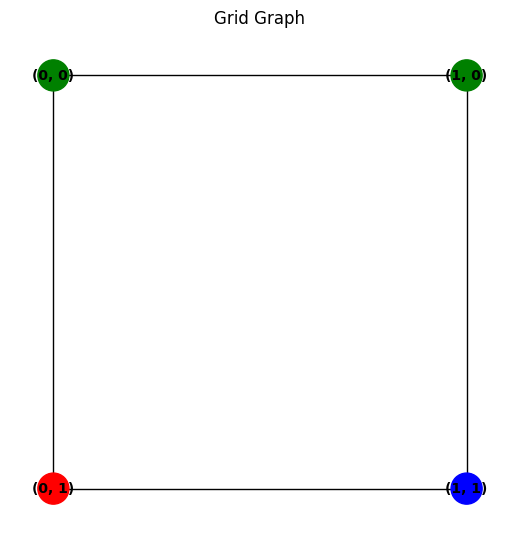

step 19 : -1
action : 3


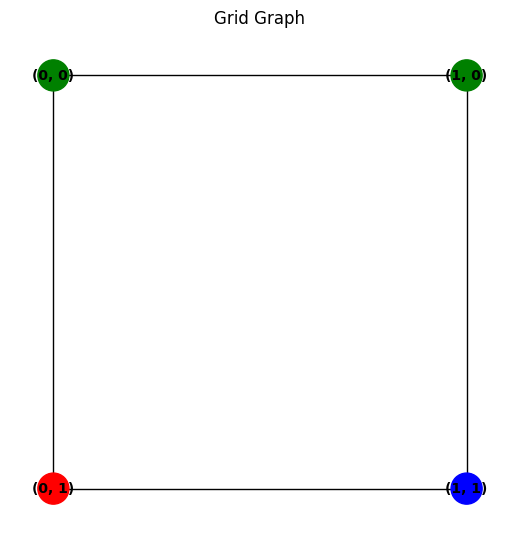

step 20 : -1
action : 3


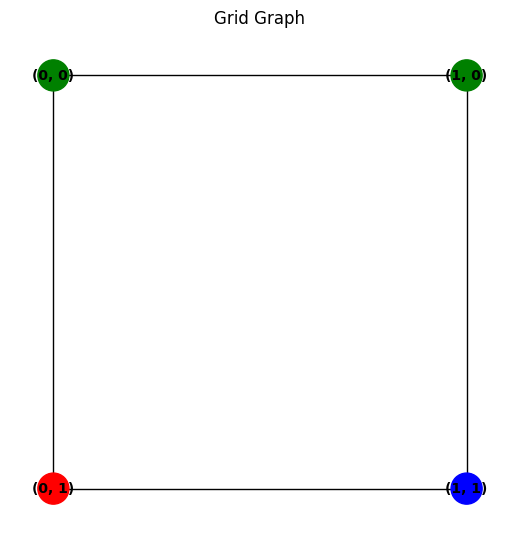

step 21 : -1
action : 3


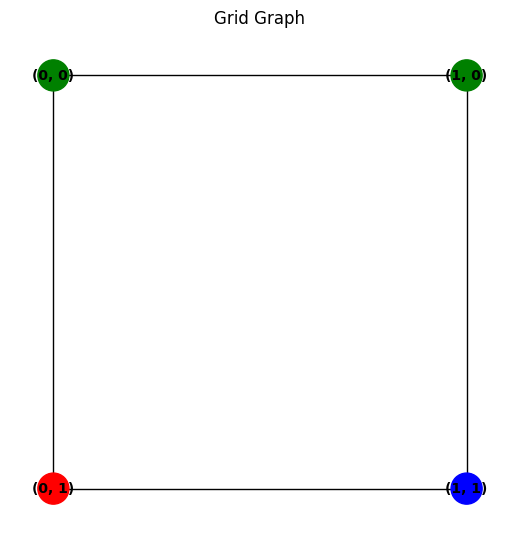

step 22 : -1
action : 3


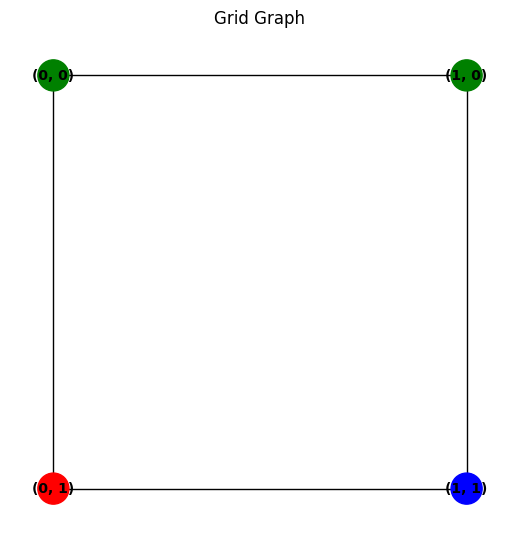

step 23 : -1
action : 3


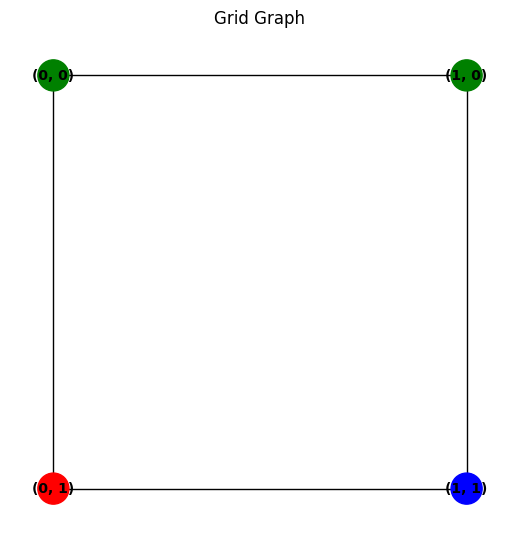

step 24 : -1
action : 3


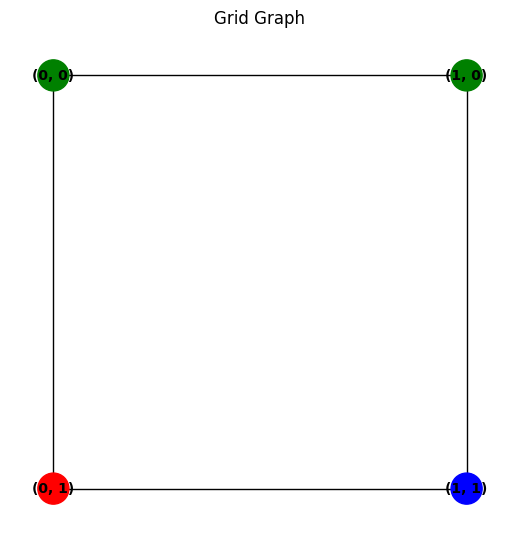

step 25 : -1
action : 3


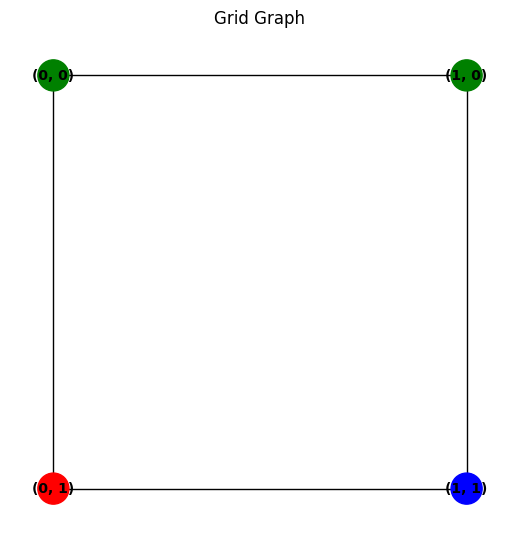

step 26 : -1
action : 3


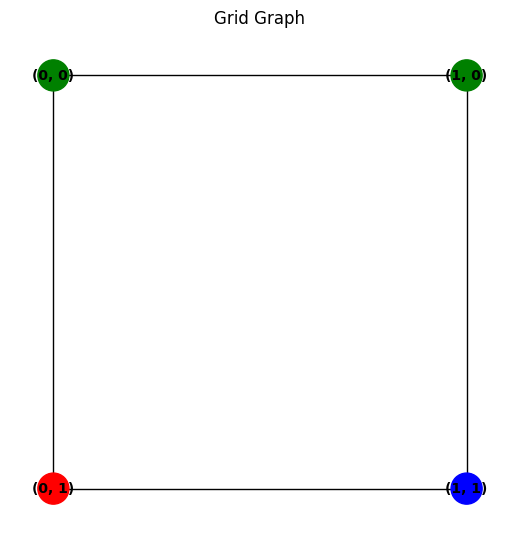

step 27 : -1
action : 3


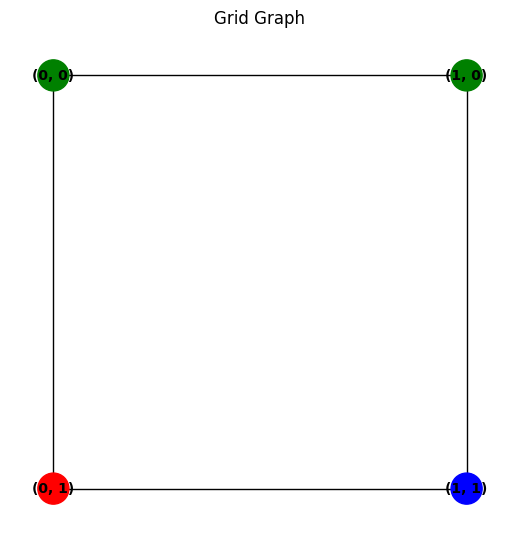

step 28 : -1
action : 3


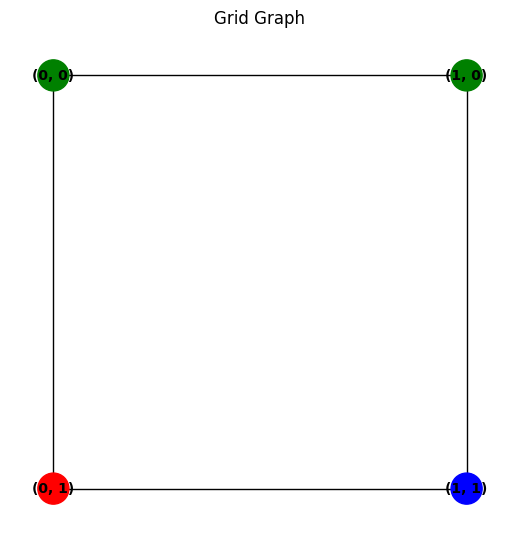

step 29 : -1
action : 3


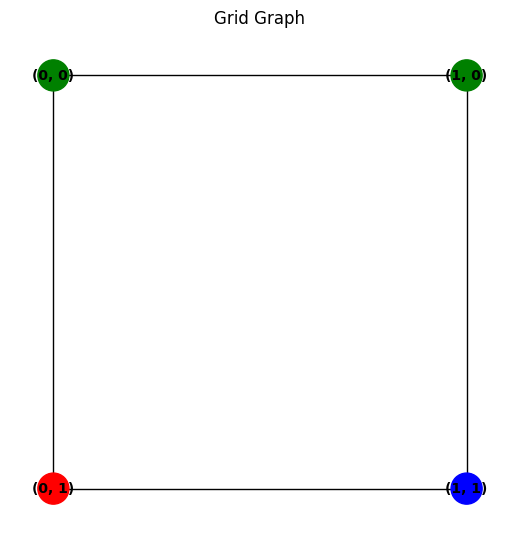

step 30 : -1
action : 3


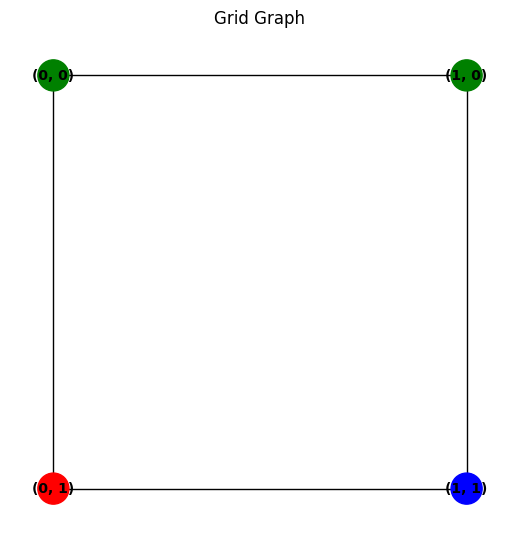

step 31 : -1
action : 3


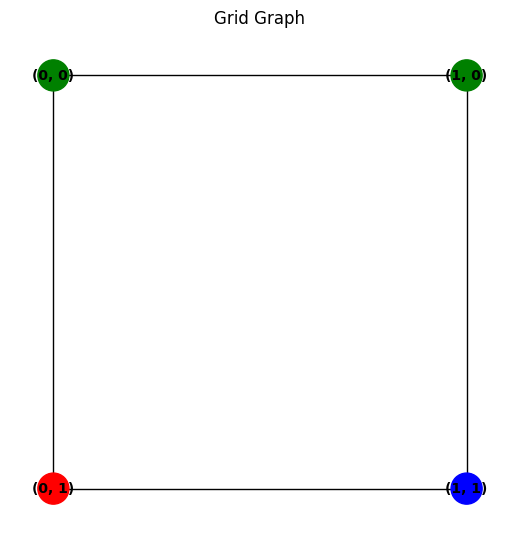

step 32 : -1
action : 3


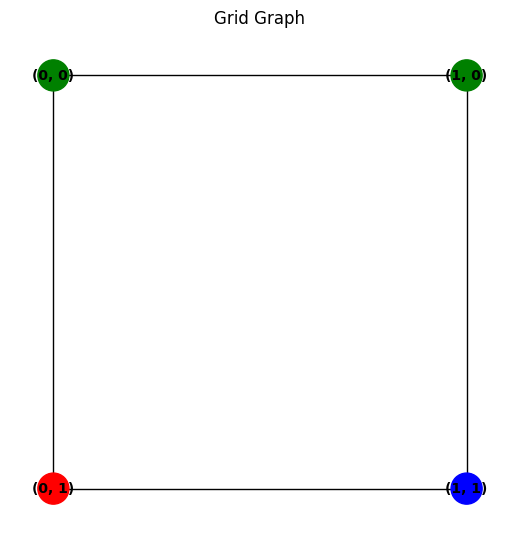

step 33 : -1
action : 3


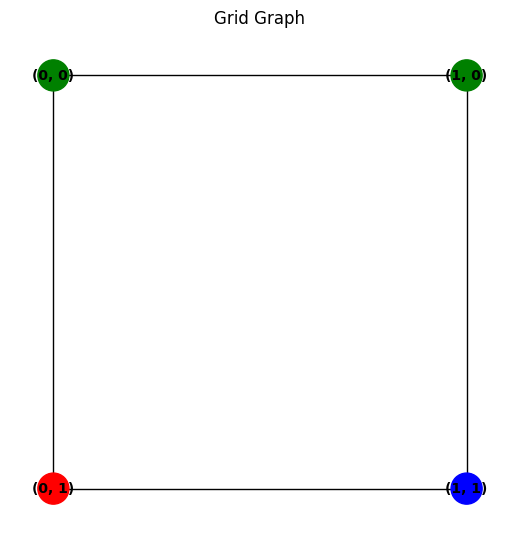

step 34 : -1
action : 3


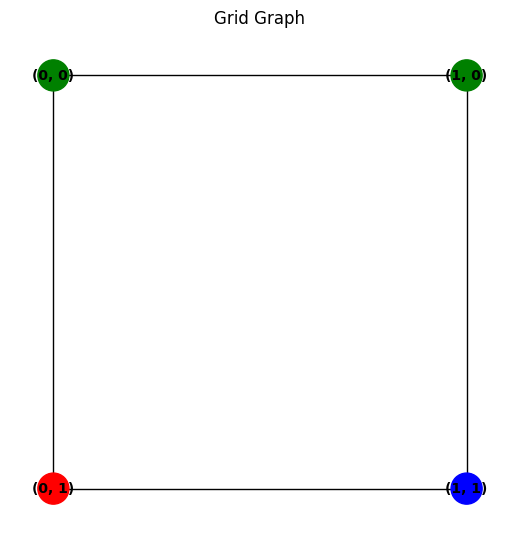

step 35 : -1
action : 3


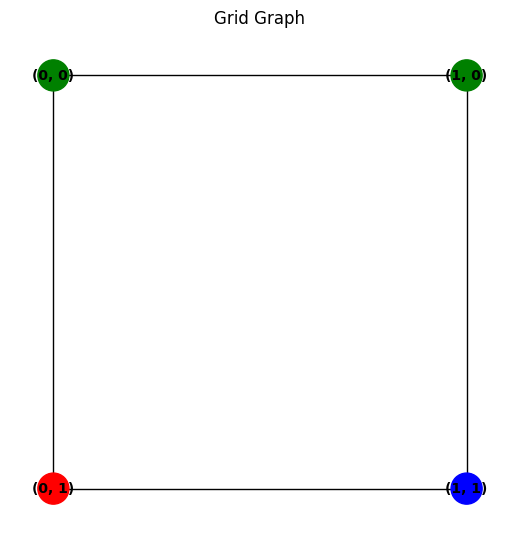

step 36 : -1
action : 3


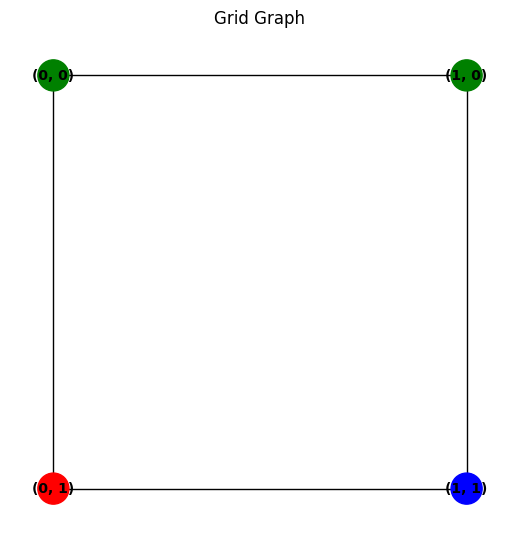

step 37 : -1
action : 3


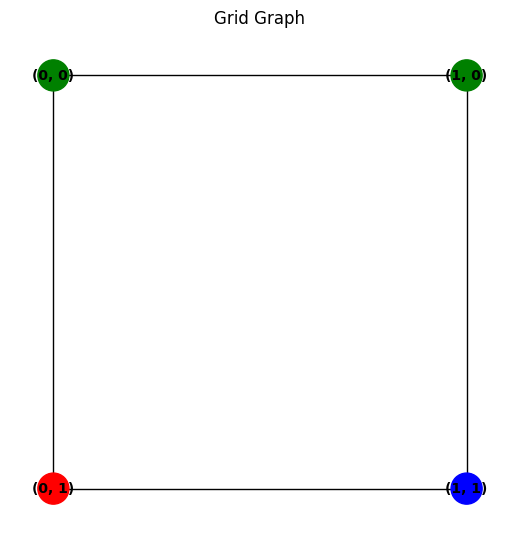

step 38 : -1
action : 3


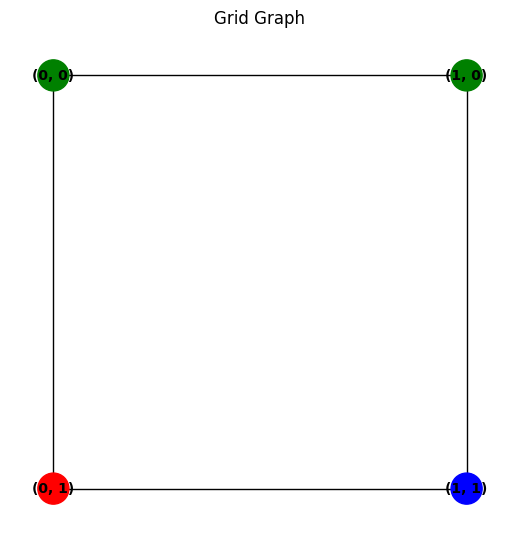

step 39 : -1
action : 3


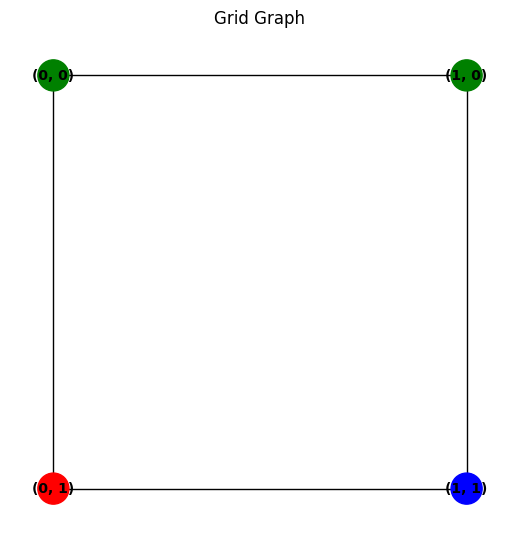

step 40 : -1
action : 3


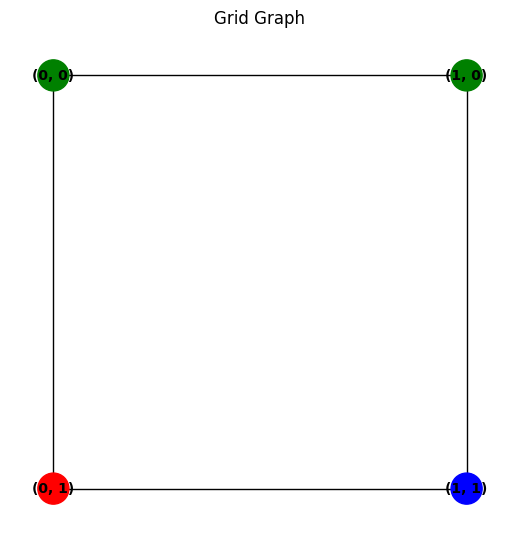

step 41 : -1
action : 3


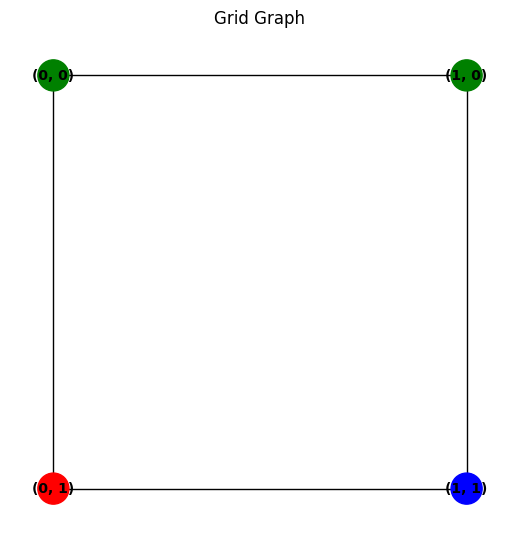

step 42 : -1
action : 3


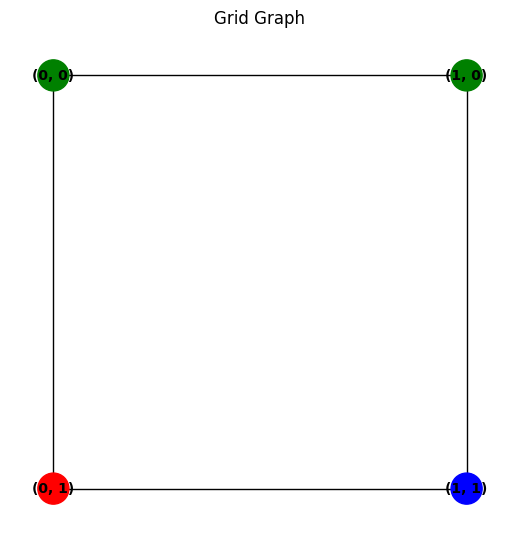

step 43 : -1
action : 3


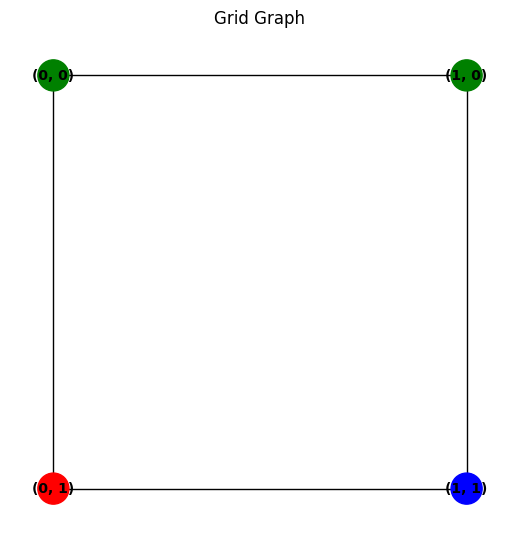

step 44 : -1
action : 3


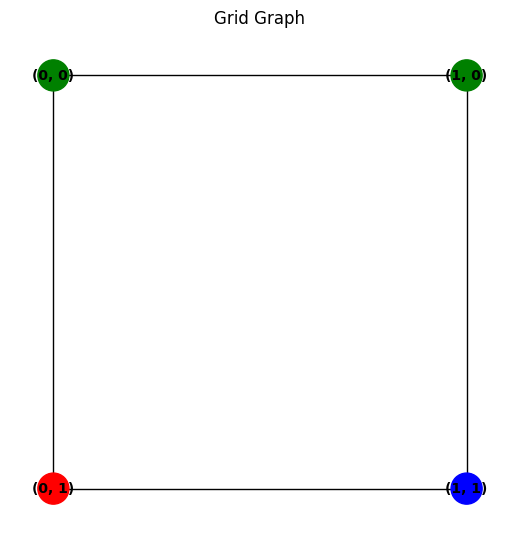

step 45 : -1
action : 3


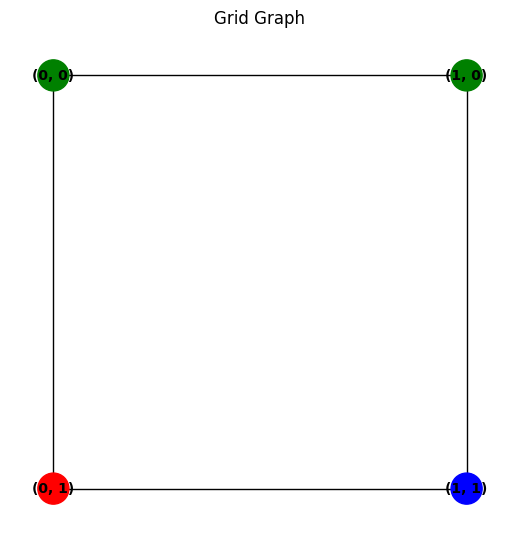

step 46 : -1
action : 3


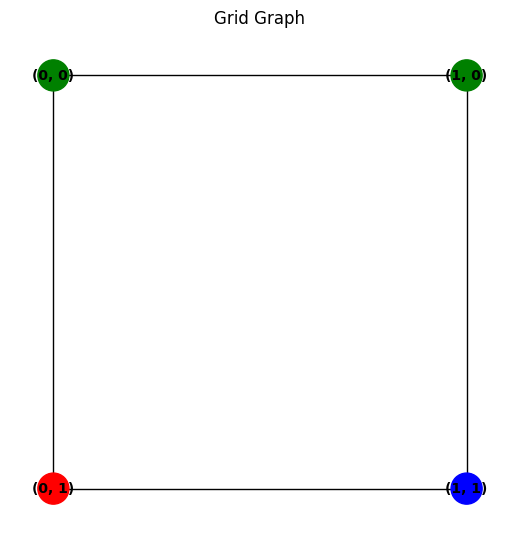

step 47 : -1
action : 3


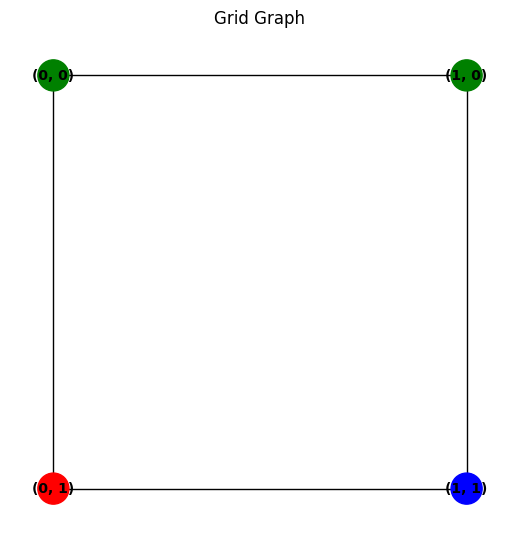

step 48 : -1
action : 3


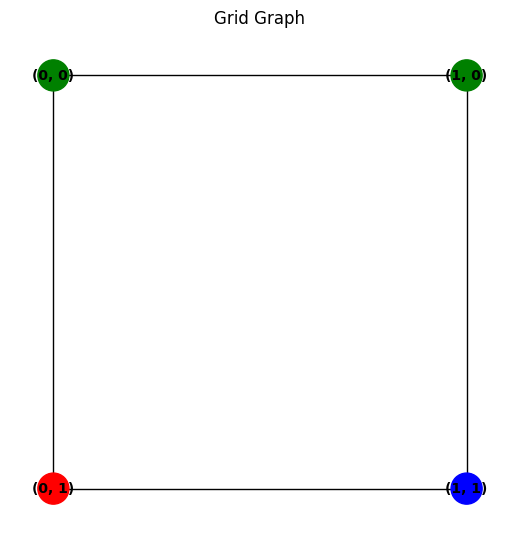

step 49 : -1
action : 3


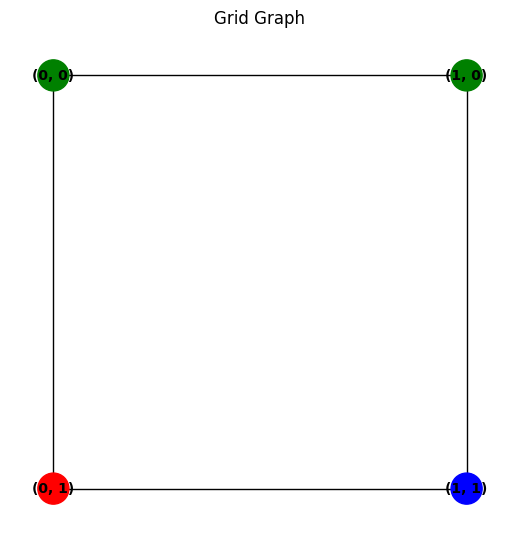

step 50 : -1
action : 3


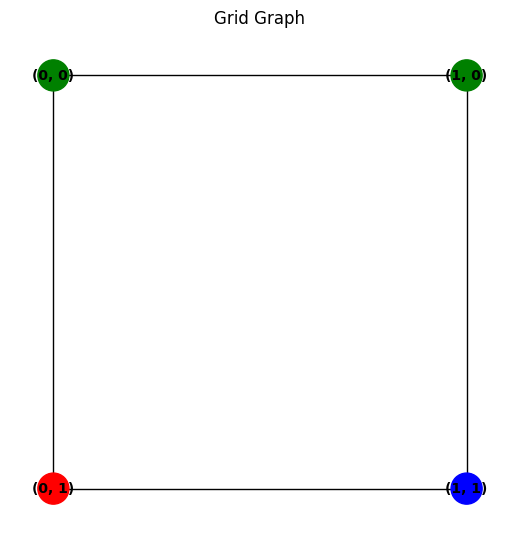

step 51 : -1
action : 3


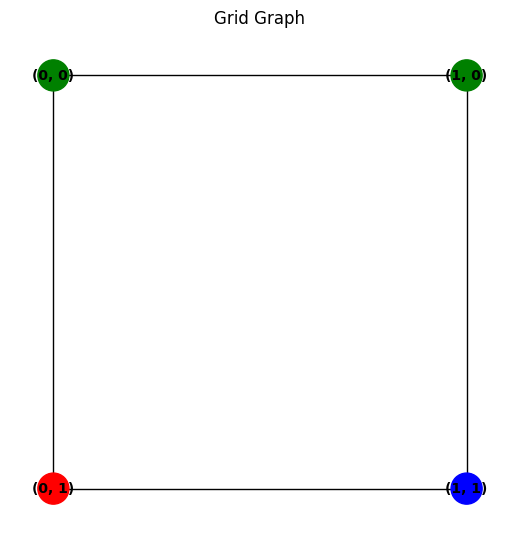

step 52 : -1
action : 3


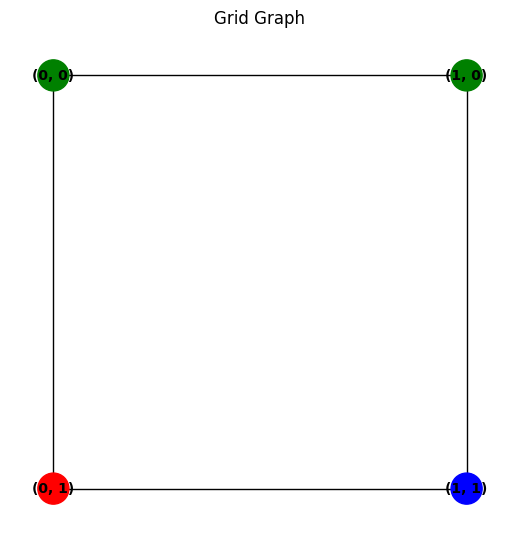

step 53 : -1
action : 3


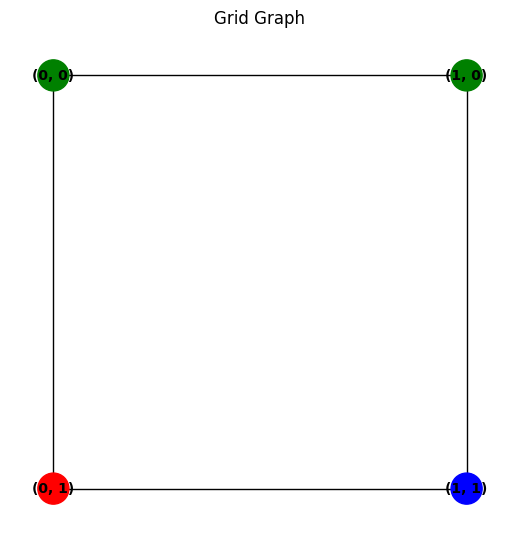

step 54 : -1
action : 3


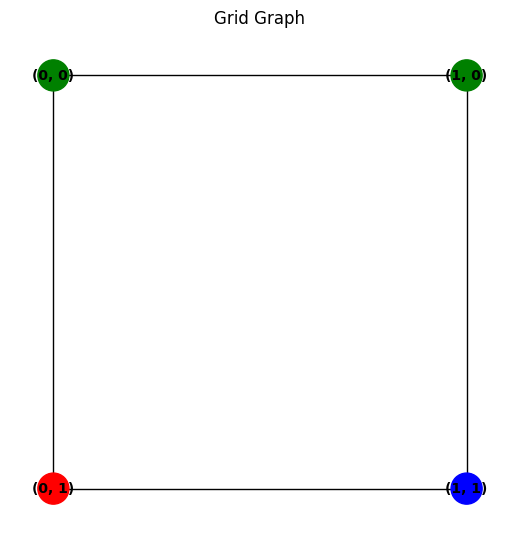

step 55 : -1
action : 3


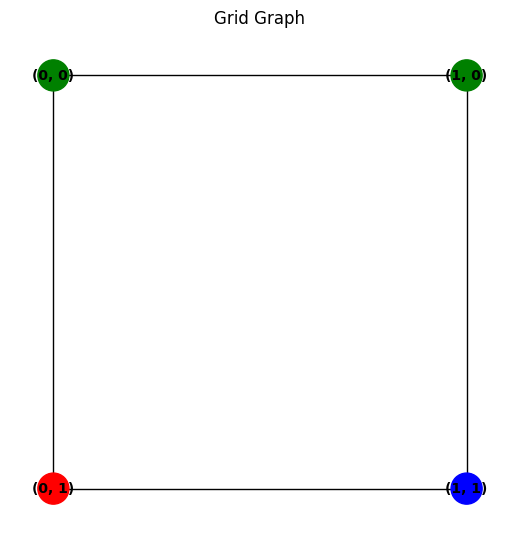

step 56 : -1
action : 3


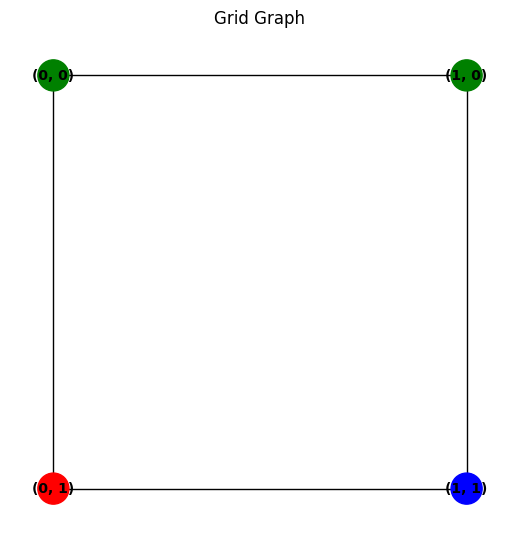

step 57 : -1
action : 3


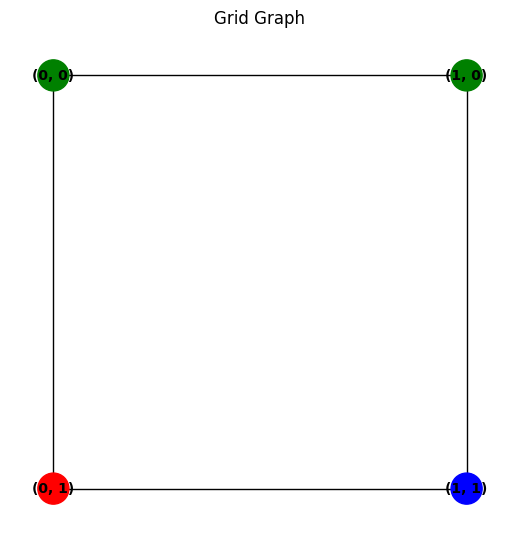

step 58 : -1
action : 3


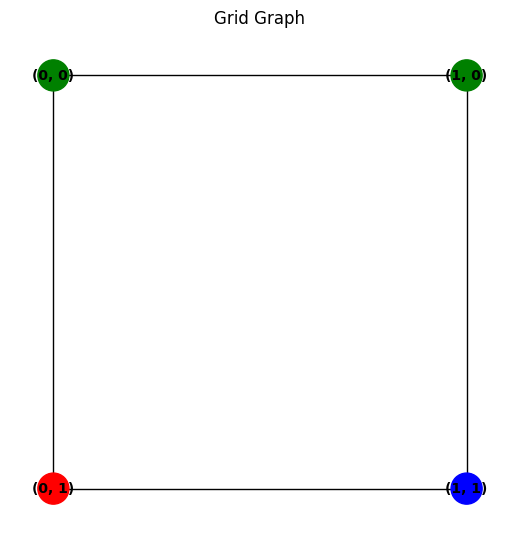

step 59 : -1
action : 3


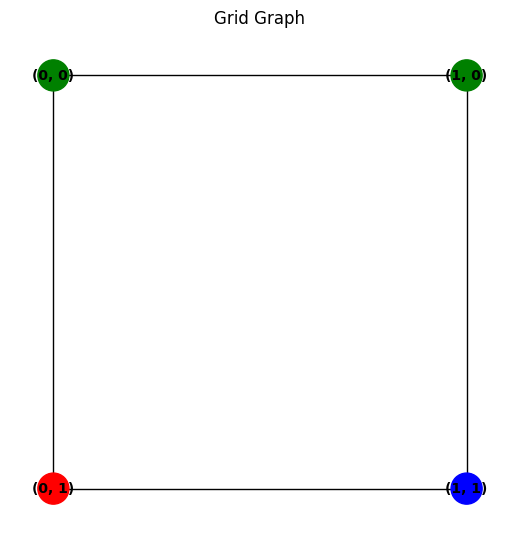

step 60 : -1
action : 3


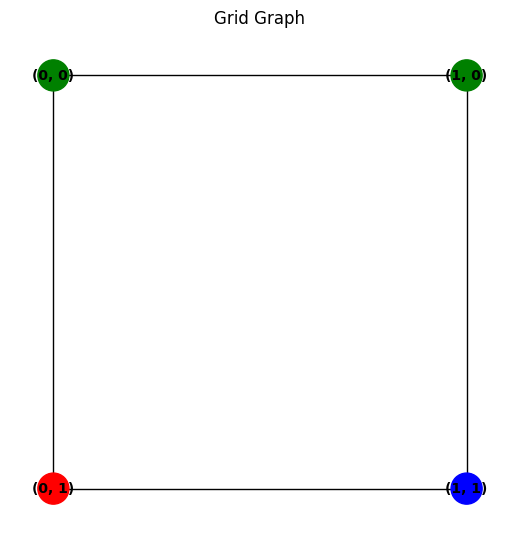

step 61 : -1
action : 3


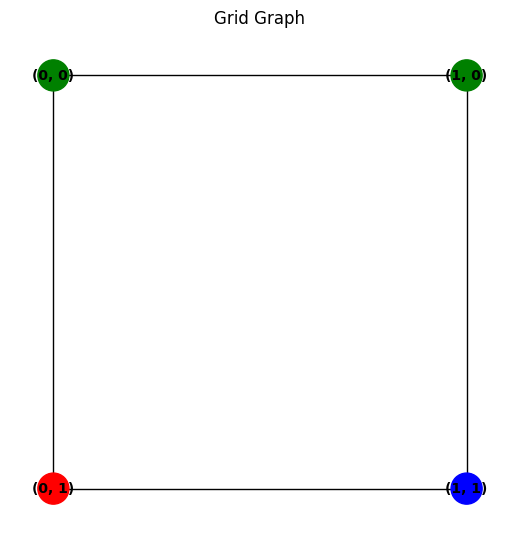

step 62 : -1
action : 3


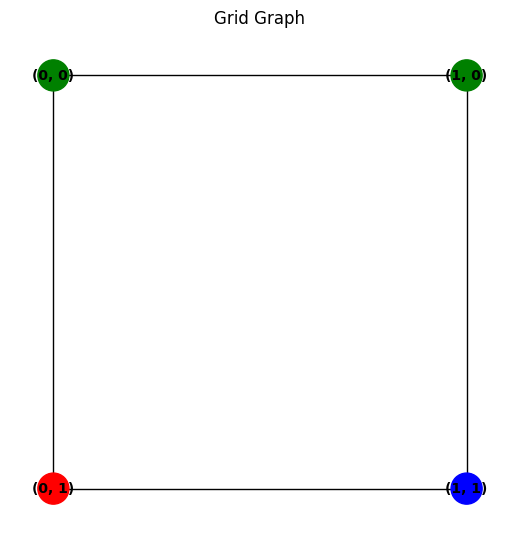

step 63 : -1
action : 3


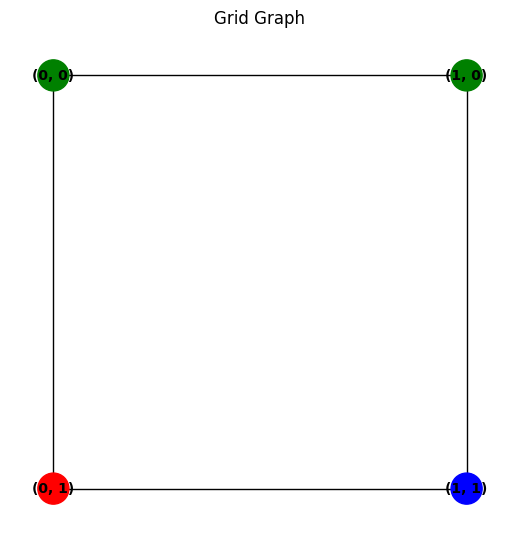

step 64 : -1
action : 3


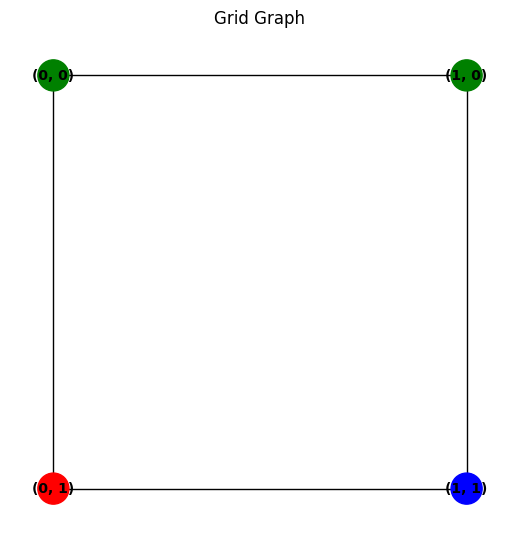

step 65 : -1
action : 3


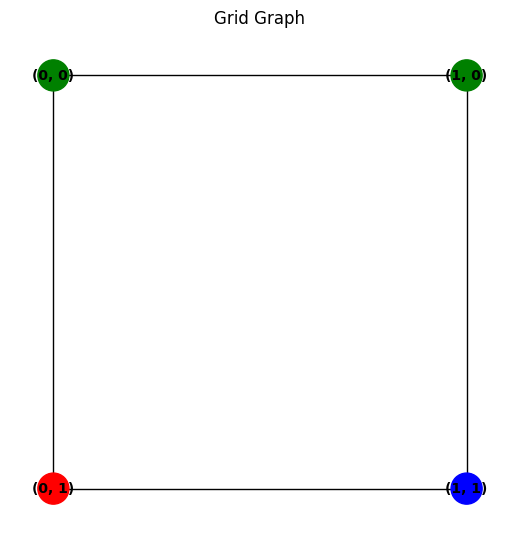

step 66 : -1
action : 3


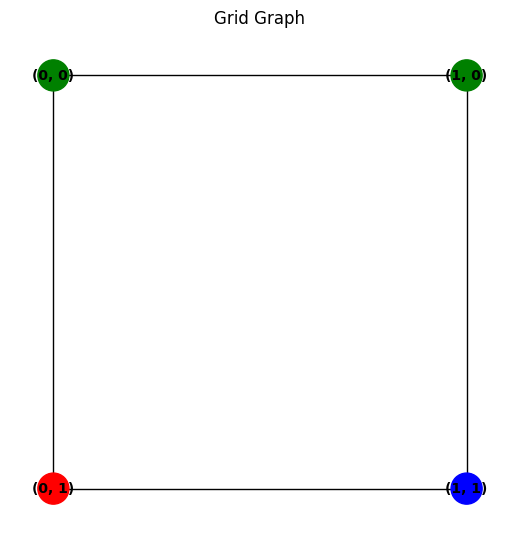

step 67 : -1
action : 3


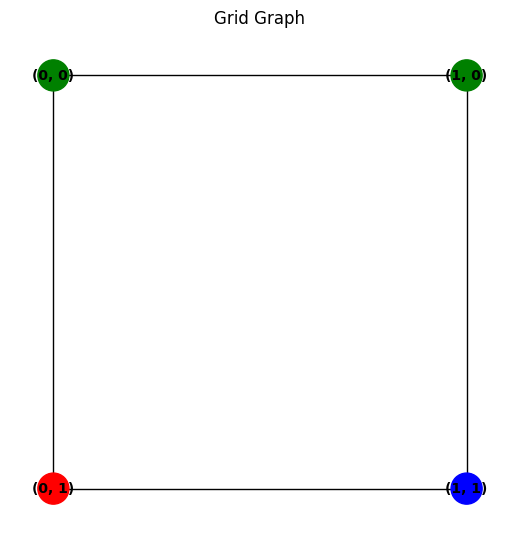

step 68 : -1
action : 3


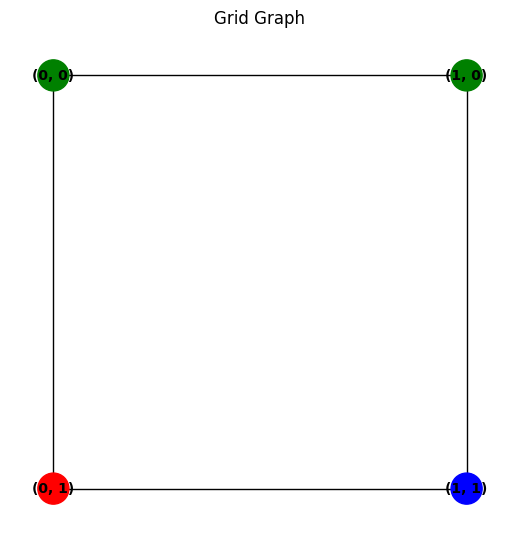

step 69 : -1
action : 3


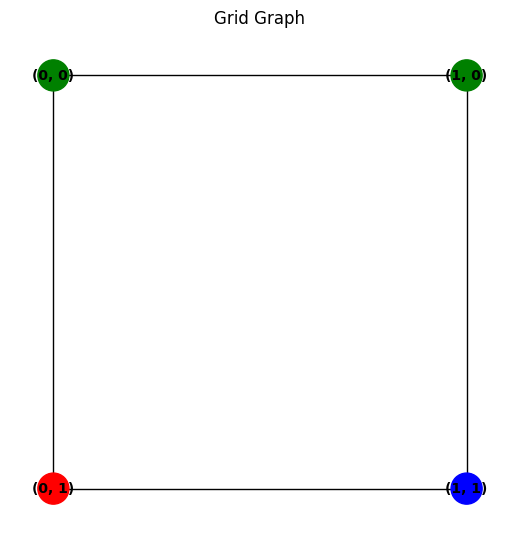

step 70 : -1
action : 3


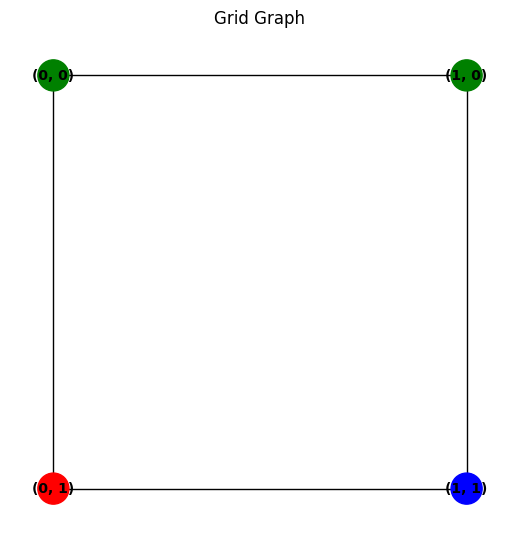

step 71 : -1
action : 3


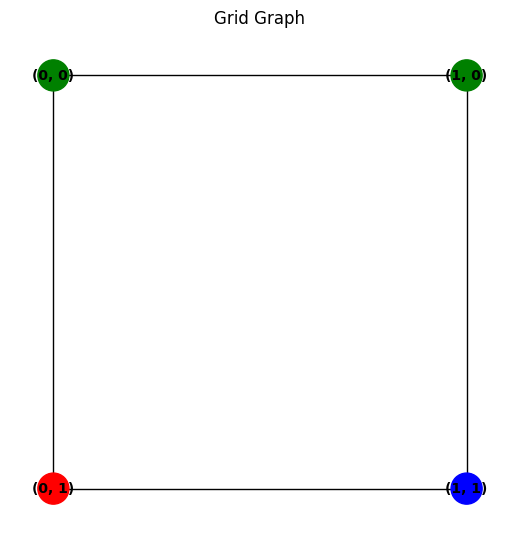

step 72 : -1
action : 3


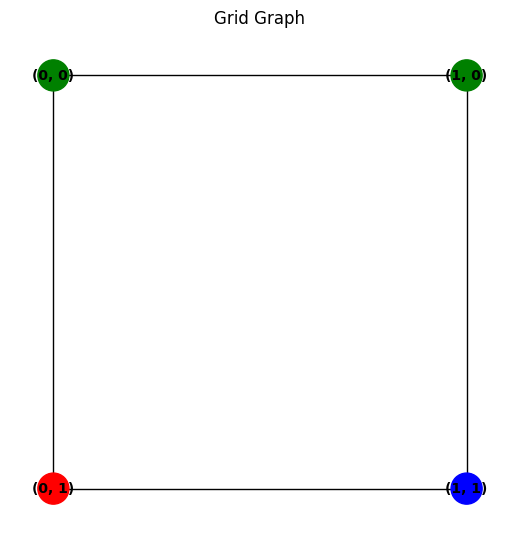

step 73 : -1
action : 3


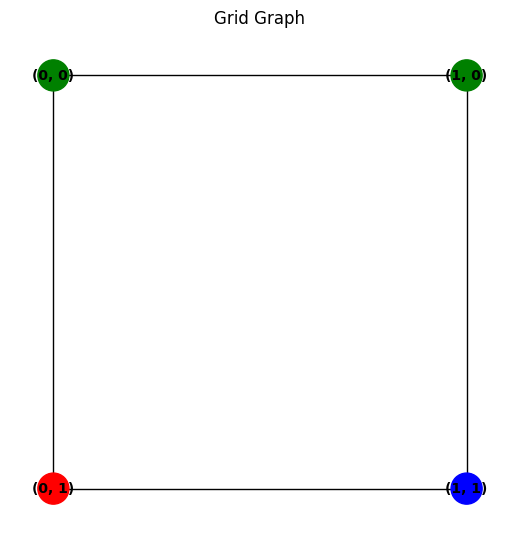

step 74 : -1
action : 3


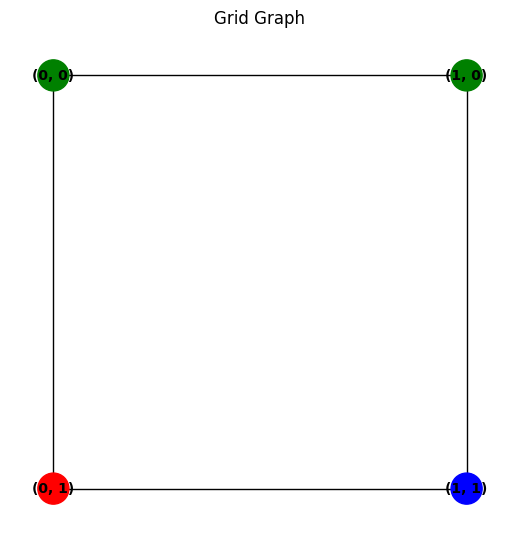

step 75 : -1
action : 3


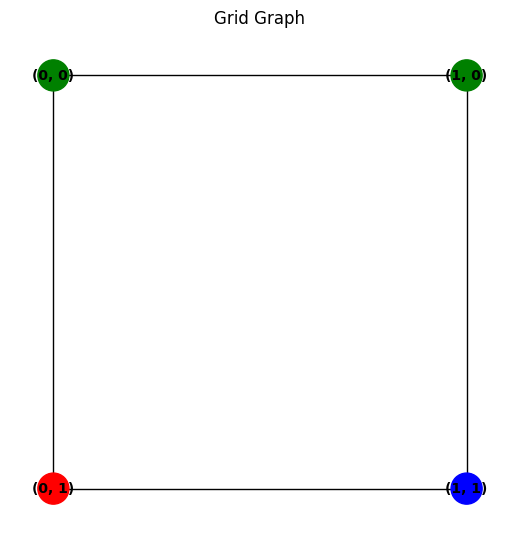

step 76 : -1
action : 3


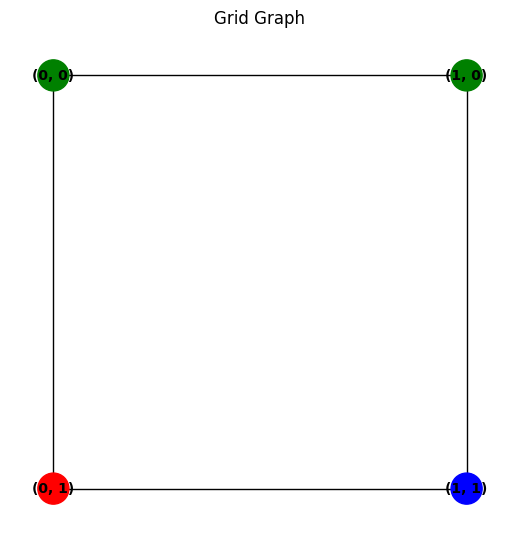

step 77 : -1
action : 3


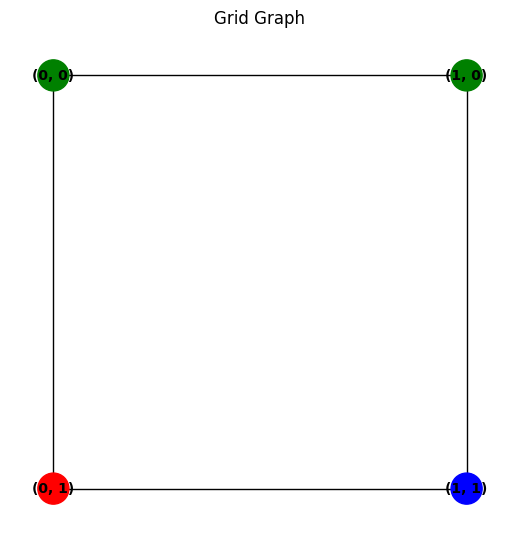

step 78 : -1
action : 3


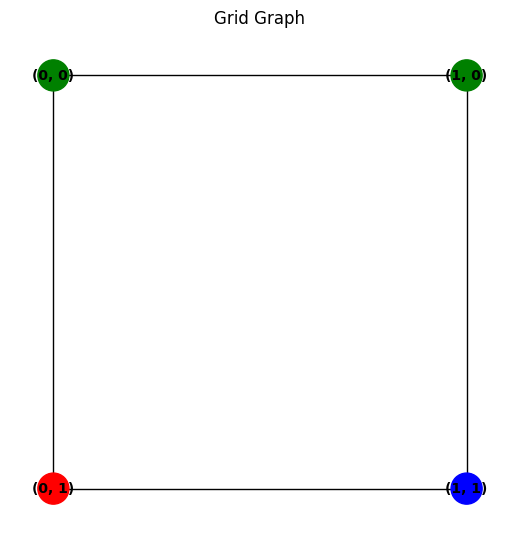

step 79 : -1
action : 3


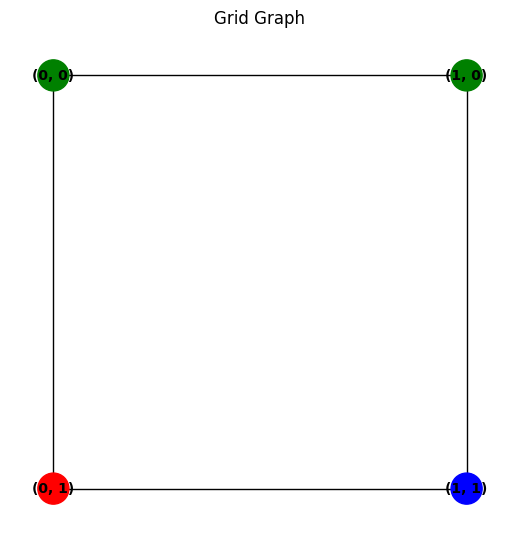

step 80 : -1
action : 3


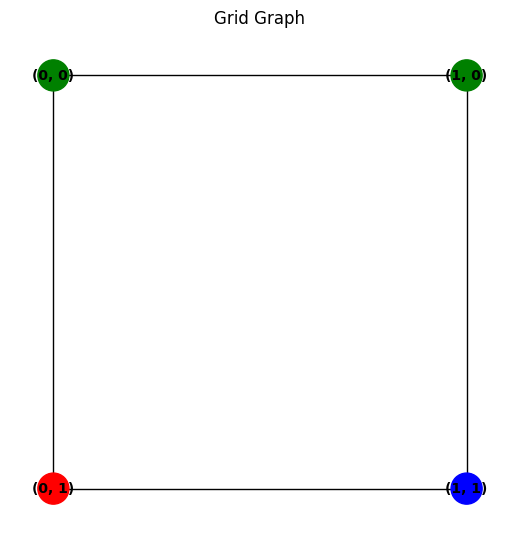

step 81 : -1
action : 3


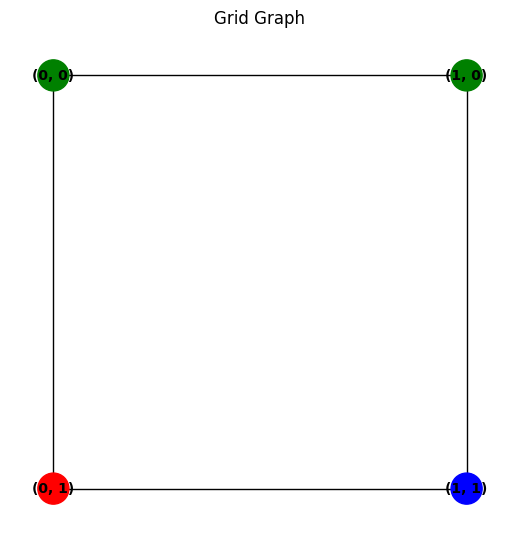

step 82 : -1
action : 3


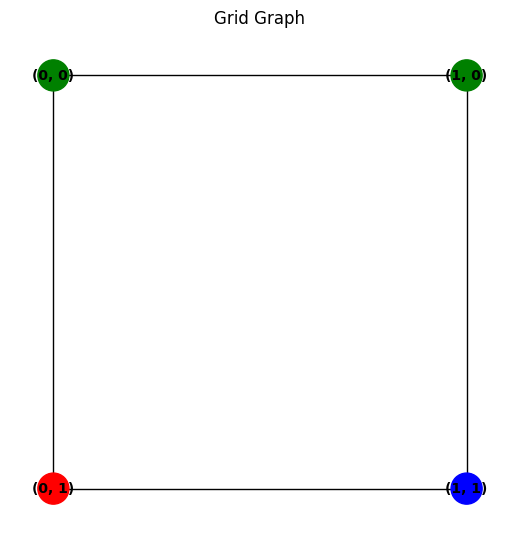

step 83 : -1
action : 3



KeyboardInterrupt



In [83]:
dqn.evaluate()